In [17]:
#importing libraries and loading data

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as st
import plotly.graph_objects as go

!pip install missingno
import missingno as msno

from sklearn import preprocessing
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score, classification_report
from scipy import stats

In [18]:
train = pd.read_csv('WineQT.csv')
train.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595
1142,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,1597


In [11]:
# fixed acidity - 산미 (와인의 산도를 제어)
# volatile acidity - 휘발산 (와인의 향을 좌우)
# chlorides - 염소(짠맛과 신맛을 좌우하는 성분)
# sulfur dioxide / sulphates (황산염) - 효모를 죽여 와인의 보관도를 높여주는 정도
# density - 와인의 바디감을 의미
# pH - 산성도 (와인의 신맛을 좌우)

In [19]:
train = train.set_index('Id')

## Data Information

In [20]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1143 entries, 0 to 1597
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 116.1 KB


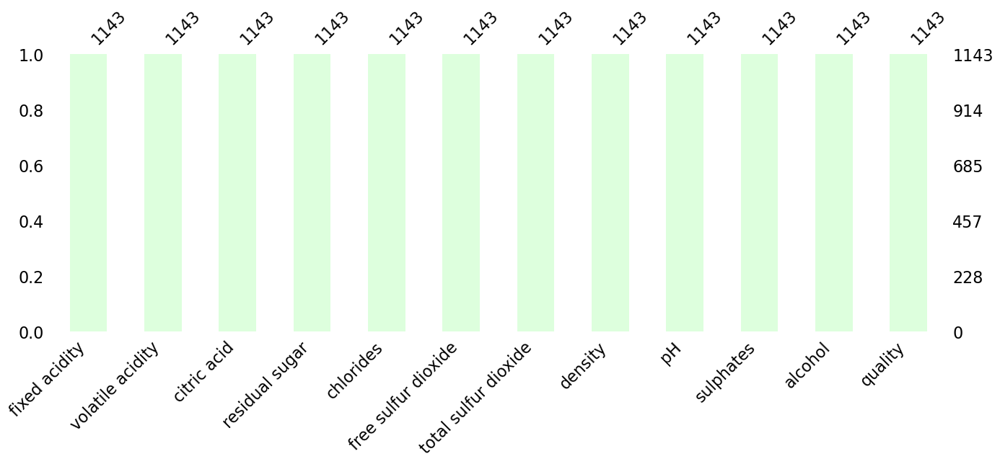

In [25]:
#Data Analysis

msno.bar(train, figsize = (16,5), color = '#dfdf')
plt.show()

In [26]:
#no missing data!

In [28]:
train.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [29]:
columns = train.columns

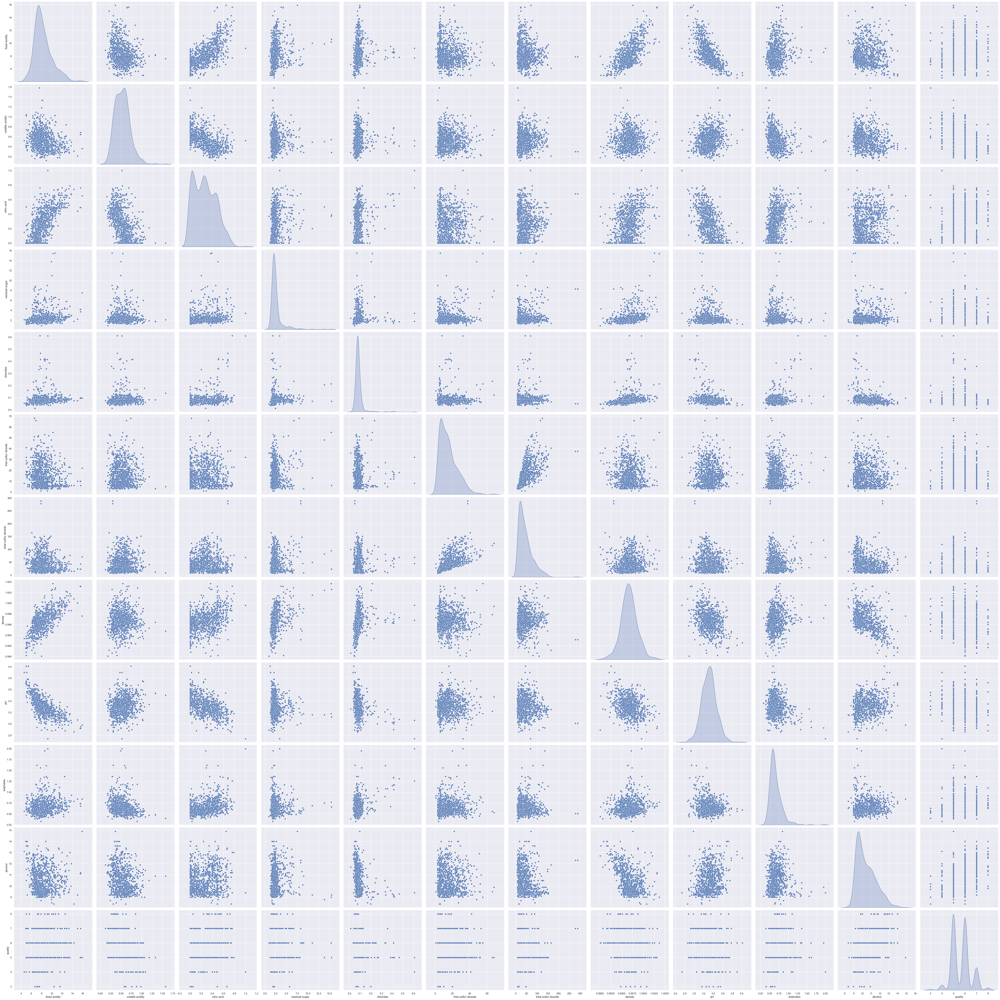

In [30]:
sns.set()
sns.pairplot(train[columns], height = 5, kind = 'scatter', diag_kind = 'kde')
plt.show()

In [44]:
#quality의 분포도 살펴보기

fig = go.Figure(data = [go.Pie(labels = train['quality'].value_counts().index, 
                               values = train['quality'].value_counts(), hole = .3)])
fig.update_layout(legend_title_text = 'Quality')
fig.show()

Text(0.5, 0.98, 'Visualizing continuous columns')

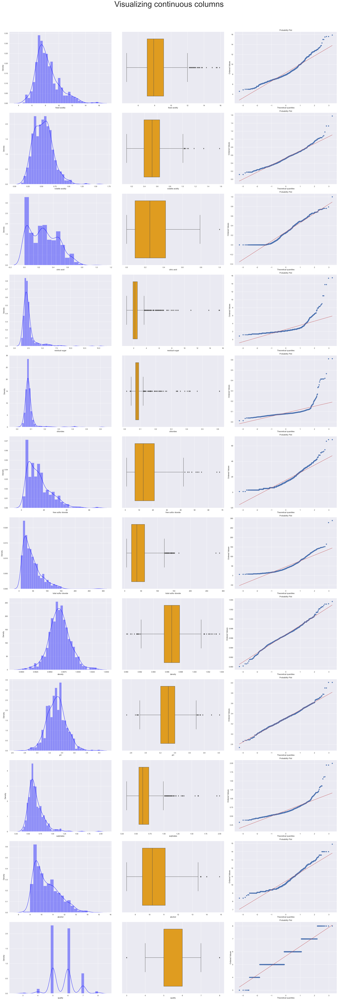

In [48]:
#각 요소와 quality 사이의 상관관계를 distplot, boxplot, probplot 형태로 다양하게 시각화하기

import warnings
warnings.filterwarnings('ignore')
fig, ax = plt.subplots(12, 3, figsize = (30,90))
for index, i in enumerate(train.columns):
    sns.distplot(train[i], ax = ax[index,0], color = 'blue')
    sns.boxplot(train[i], ax = ax[index,1], color = 'orange')
    stats.probplot(train[i], plot = ax[index,2])
    
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.suptitle("Visualizing continuous columns", fontsize = 50)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


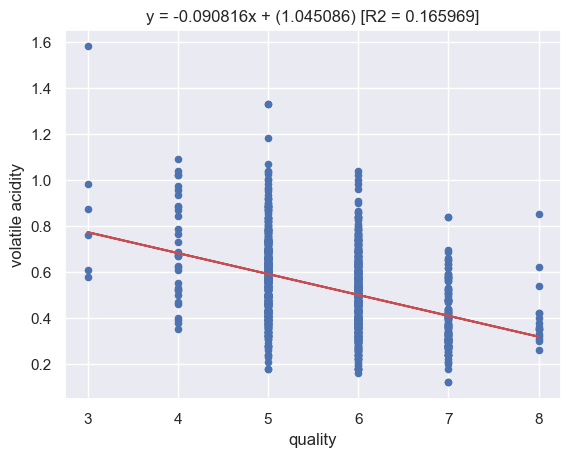

In [68]:
#[추가 분석] 향의 휘발성과 퀄리티의 상관관계는 어느정도일까?

import numpy as np
from sklearn.metrics import r2_score
train.plot(kind = 'scatter', x = 'quality', y = 'volatile acidity')
fit_weight = np.polyfit(train['quality'], train['volatile acidity'], 1)
#'quality'컬럼을 x값으로, 'volatile acidity'컬럼을 y값으로 하여 1차식으로 피팅한다
trend_f = np.poly1d(fit_weight)
r2 = r2_score(train['volatile acidity'], trend_f(train['quality']))
#결정계수 구하기 - 독립변수와 종속변수의 상관관계가 높을수록 결정계수는 1에 가까워진다

plt.plot(train['quality'], trend_f(train['quality']), "r-")
plt.title("y = {:.6f}x + ({:.6f}) [R2 = {:.6f}]".format(fit_weight[0], fit_weight[1], r2))
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


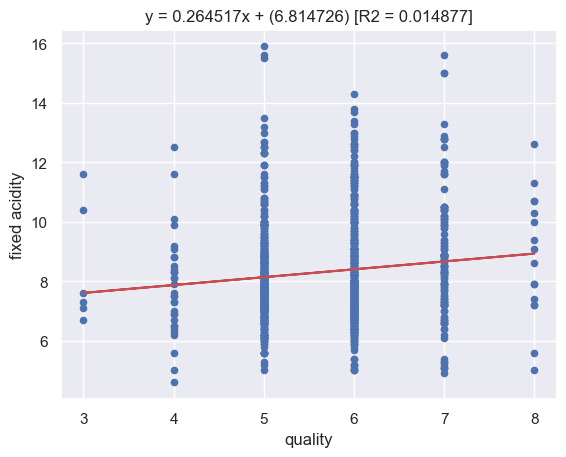

In [69]:
import numpy as np
from sklearn.metrics import r2_score
train.plot(kind = 'scatter', x = 'quality', y = 'fixed acidity')
fit_weight = np.polyfit(train['quality'], train['fixed acidity'], 1)
trend_f = np.poly1d(fit_weight)
r2 = r2_score(train['fixed acidity'], trend_f(train['quality']))

plt.plot(train['quality'], trend_f(train['quality']), "r-")
plt.title("y = {:.6f}x + ({:.6f}) [R2 = {:.6f}]".format(fit_weight[0], fit_weight[1], r2))
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


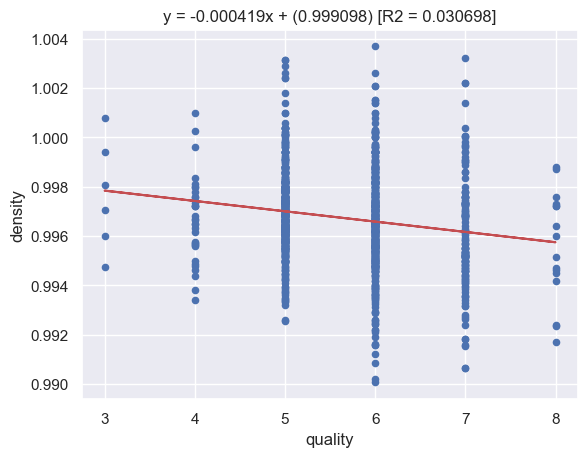

In [74]:
import numpy as np
from sklearn.metrics import r2_score
train.plot(kind = 'scatter', x = 'quality', y = 'density')
fit_weight = np.polyfit(train['quality'], train['density'], 1)
trend_f = np.poly1d(fit_weight)
r2 = r2_score(train['density'], trend_f(train['quality']))

plt.plot(train['quality'], trend_f(train['quality']), "r-")
plt.title("y = {:.6f}x + ({:.6f}) [R2 = {:.6f}]".format(fit_weight[0], fit_weight[1], r2))
plt.show()

In [ ]:
#결론> 회귀분석에 따르면 volatile acidity와 quality는 조금 낮은 상관관계를 가진다는 것을 알 수 있다.
#그러나 다른 성분들을 비교해봤을 때 (density, fixed acidity 등) 다른 성분들과는 0.0x 정도로 더 낮은 상관 관계를 가진다는 것을 알 수 있다.

In [ ]:
train.plot(kind)

## statistical tests

In [31]:
for column_name in train.columns:
    unique_values = len(train[column_name].unique())
    #중복을 제거한 column별 값이 몇 개씩 있는지 구하기
    print("Feature '{column_name}' has '{unique_values}' unique values".format(column_name = column_name, unique_values = unique_values))

Feature 'fixed acidity' has '91' unique values
Feature 'volatile acidity' has '135' unique values
Feature 'citric acid' has '77' unique values
Feature 'residual sugar' has '80' unique values
Feature 'chlorides' has '131' unique values
Feature 'free sulfur dioxide' has '53' unique values
Feature 'total sulfur dioxide' has '138' unique values
Feature 'density' has '388' unique values
Feature 'pH' has '87' unique values
Feature 'sulphates' has '89' unique values
Feature 'alcohol' has '61' unique values
Feature 'quality' has '6' unique values


In [33]:
import scipy.stats

#u : Mann-Whitney test statistic
#(두 집단의 데이터들이 정규분포를 따른다고 가정하지 않거나 집단의 데이터가 작을 때 두 집단의 차이를 분석하는 방법)
#p : p-value
#(데이터의 검정통계량이 귀무가설을 지지하는 정도를 확률로 표현한 것. 작을수로 귀무가설 지지도가 작으므로 귀무가설이 기각된다)

for feature in train.columns:
    u, p = scipy.stats.mannwhitneyu(train['quality'], train[feature])
    print('With', feature)
    print('Mann-Whitney test statistic:', u)
    print('p-value:', p)
    print('-------------------------------')

With fixed acidity
Mann-Whitney test statistic: 66226.0
p-value: 9.63134461738031e-309
-------------------------------
With volatile acidity
Mann-Whitney test statistic: 1306449.0
p-value: 0.0
-------------------------------
With citric acid
Mann-Whitney test statistic: 1306449.0
p-value: 0.0
-------------------------------
With residual sugar
Mann-Whitney test statistic: 1252515.0
p-value: 0.0
-------------------------------
With chlorides
Mann-Whitney test statistic: 1306449.0
p-value: 0.0
-------------------------------
With free sulfur dioxide
Mann-Whitney test statistic: 188217.0
p-value: 8.301665837510123e-197
-------------------------------
With total sulfur dioxide
Mann-Whitney test statistic: 645.0
p-value: 0.0
-------------------------------
With density
Mann-Whitney test statistic: 1306449.0
p-value: 0.0
-------------------------------
With pH
Mann-Whitney test statistic: 1299678.0
p-value: 0.0
-------------------------------
With sulphates
Mann-Whitney test statistic: 13064

In [ ]:
#결과로 보면 free sulfur dioxide, fixed acidity의 유의수준이 크다

In [34]:
#quality를 기준으로 다른 성분들과의 상관관계 구하기
correlation = train.corr() #상관관계
print(correlation['quality'].sort_values(ascending = False), '\n')
#양의 상관관계 (+) / 음의 상관관계 (-)

quality                 1.000000
alcohol                 0.484866
sulphates               0.257710
citric acid             0.240821
fixed acidity           0.121970
residual sugar          0.022002
pH                     -0.052453
free sulfur dioxide    -0.063260
chlorides              -0.124085
density                -0.175208
total sulfur dioxide   -0.183339
volatile acidity       -0.407394
Name: quality, dtype: float64 



In [73]:
#양의 상관관계 - alcohol, sulphates, citric acid, fixed acidity, residual sugar
#음의 상관관계 - pH, free sulfur dioxide, chlorides, density, total sulfur dioxide, volatile acidity
#양의 상관관계가 가장 큰 것은 alcohol / 음의 상관관계가 가장 큰 것은 volatile acidity

Index(['quality', 'alcohol', 'sulphates', 'citric acid', 'fixed acidity',
       'residual sugar', 'pH', 'free sulfur dioxide', 'chlorides', 'density'],
      dtype='object')


<AxesSubplot:>

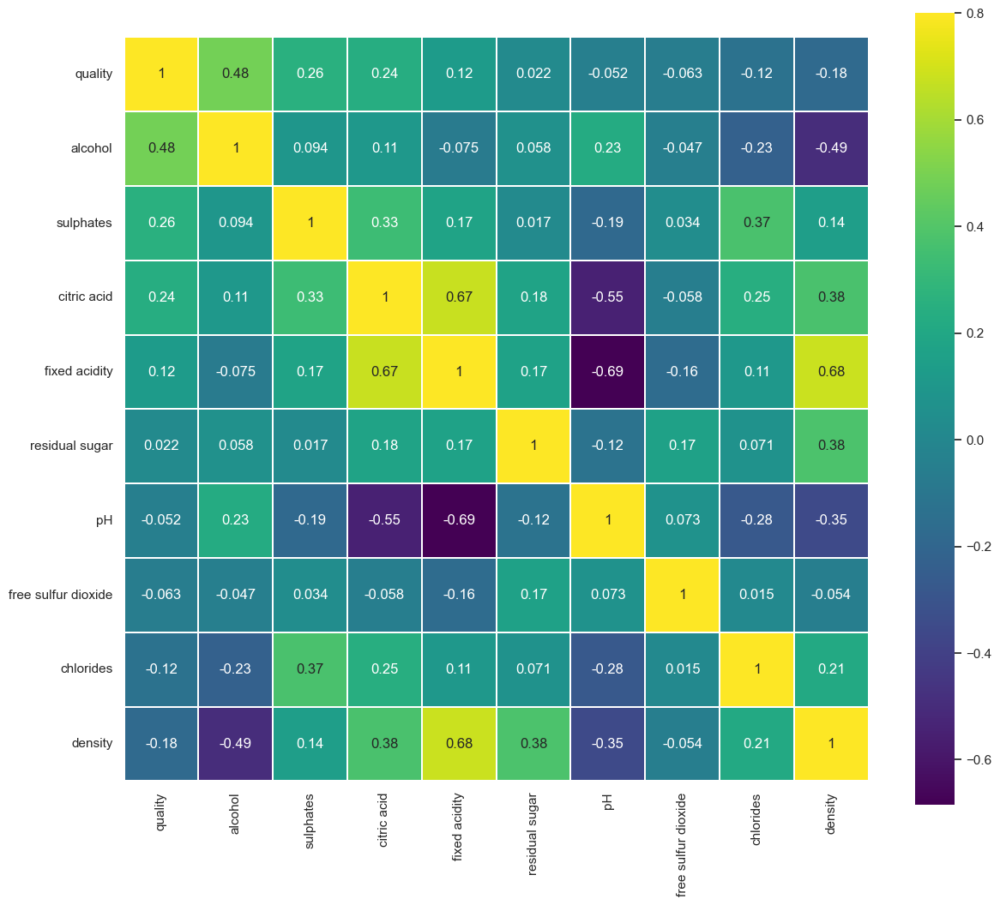

In [36]:
k = 10
cols = correlation.nlargest(k, 'quality')['quality'].index
print(cols)
cm = np.corrcoef(train[cols].values.T)
f, ax = plt.subplots(figsize = (14,12))
sns.heatmap(cm, vmax = .8, linewidths = 0.01, square = True, annot=True, cmap = 'viridis', 
           linecolor = 'white', xticklabels = cols.values, annot_kws = {'size': 12}, yticklabels = cols.values)

**어려웠던 코드 정리**


warnings.filterwarnings('ignore')
=> warnings 라이브러리로 경고메시지를 무시하고 싶을 때 사용


for index, i in enumerate(train.columns):
=> enumerate 함수는 입력으로 받은 데이터와 인덱스 값을 포함하는 enumerate 객체를 리턴해준다.

for문을 돌리면 리스트의 원소와 인덱스가 튜플 형태로 담겨짐


cols = correlation.nlargest(k, 'quality')['quality'].index
=> 기본형태> DataFrame.nlargest(n, columns, keep='first')

quality 기준으로 숫자 크기가 큰 컬럼 순서대로 출력
k =10개로 했기 때문에 10개까지 값을 보여주는 것


cm = np.corrcoef(train[cols].values.T)
=> .corrcoef() : train의 컬럼 서로에 대한 상관계수 메트릭스를 리턴시키는 함수

## Engineering and machine learning

In [49]:
!pip install imblearn
from imblearn.over_sampling import SMOTE

In [50]:
oversample = SMOTE()
features, labels = oversample.fit_resample(train.drop(["quality"], axis = 1), train["quality"])

In [51]:
scaler = preprocessing.MinMaxScaler()
names = features.columns
d = scaler.fit_transform(features)

scaled_df = pd.DataFrame(d, columns = names)
scaled_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.247788,0.397260,0.00,0.068493,0.106845,0.149254,0.098940,0.567548,0.606299,0.137725,0.153846
1,0.283186,0.520548,0.00,0.116438,0.143573,0.358209,0.215548,0.494126,0.362205,0.209581,0.215385
2,0.283186,0.438356,0.04,0.095890,0.133556,0.208955,0.169611,0.508811,0.409449,0.191617,0.215385
3,0.584071,0.109589,0.56,0.068493,0.105175,0.238806,0.190813,0.582232,0.330709,0.149701,0.215385
4,0.247788,0.397260,0.00,0.068493,0.106845,0.149254,0.098940,0.567548,0.606299,0.137725,0.153846


In [70]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV

!pip install xgboost
import xgboost as xgb

from sklearn.metrics import precision_score,recall_score
from sklearn.metrics import f1_score

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.4 MB/s eta 0:00:00a 0:00:01


In [72]:
#buile model baselines

X_train, X_test, y_train, y_test = train_test_split(scaled_df, labels, test_size=0.33, random_state=42)

lazypredict - 어떤 예측모델이 가장 적합한지 알려주는 모듈